# <span style="color:red"> Numerical Simulation Laboratory (NSL) </span>

In [26]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

<h1><font color='ForestGreen'>ESERCITAZIONE 10: Parallelizzazione e Problema Del Commesso Viaggiatore </font> </h1>

<h3><font color = 'LightGreen'>Programmazione Parallela:</font></h3>

In termini generali, il calcolo parallelo si fonda sull'esecuzione simultanea di uno o piu' programmi su molteplici microprocessori o core dello stesso processore. L'obiettivo e' essenzialmene quello di ridurre i tempi di calcolo ridistribuendo il calcolo su piu' processi. D'altro canto, pero', adottando tale paradigma, la conseguenza e' che la programmazione diviene piu' complicata: infatti occorre suddividere un singolo problema in piu' eseguibili lavoranti in parallelo.
Importante e' notare che l'efficienza della parallezzazione stessa dipende dall'algoritmo stesso e dal problema in esame: non tutti i casi si prestano a quest genere di approccio, tuttavia viene naturale l'applicazione in contesti quali la statistica ove e' sempre possibile ridistribuire i vari campionamenti su piu' nodi di calcolo: il Monte Carlo e gli Algoritmi Genetici beneficiano largamente di questo tipo di approccio.

Una strada praticabile e' quella di scrivere piu' programmi da far eseguire su piu' core,in questa esercitazione tuttavia si e' considerato e studiato il modello opposto: l'approccio SPMD, Single Program Multiple Data, caratterizzato dal fatto che ogni core vede lo stesso eseguibile, che quindi e' unico, ma lavora su un set differente di dati.
Per fare questo lavoro si fa uso della libreria MPI, Message Passing Interface, sviluppata per molteplici linguaggi al fine di permettere interarazione tra loro i nodi di esecuzione attraverso chiamate a specifiche funzioni.

<h3><font color = 'LightGreen'>Problema del Commesso Viaggiatore TSP: Parallelizzazione e Migrazioni</font></h3>

Anche in questa esercitazione viene richiesto di affrontare il problema del commesso viaggiatore, il codice, sebbene con qualche modifica, e' lo stesso della lezione precendente ed eventuali modifiche sono state implementare per renderlo compatibile  al calcolo in parallelo: quello che ci si propone e' sviluppare la ricerca genetica su molteplici processi lavoranti in parallelo. Ogni nodo, che il qualche misura si puo' intendere come un continente, eseguira' una ricerca indipendente sulla propria popolazione seguendo l'algoritmo genetico creato.
L'operazione di parallellizzazione e' di per se relativamente  semplice in virtu' della perticolare progettazione in classi sviluppata: d'altra parte, ci si e' trovati ad affrontare l'inconveniente dovuto al fatto che le librerie MPI sono compatibili solo con oggetti primitivi di tipo c, il che ha obbligato, come gia' anticipatamente osservato nell'elaborato precedente, a dovere modificare il tipo di codifica usato per definire i percorsi: in questo caso, semplicemente e forse in maniera piu' pratica, si e' banalmente convertito il vector di iteratori ad oggetti di tipo city in interi indicanti ciascuno una particolare citta': l'ordine di tali etichette intere va percio' a definire l'ordine di percorrenza e di conseguenza un particolare cromosoma appartenente  alla nostra popolazione.
Un'altra modifica, tutt'altro che da trascurare, e' introdurre un nuovo metodo che setta i numeri primi di generazione diversi per ogni nodo: in questo modo ogni nodo effettuera' una ricerca randomica diversa estraendo sequenze differenti di numeri casuali. Altrimenti, infatti, avremmo avuto lo stesso calcolo su tutti i processi.

D'altro canto utilizzare, pero', il calcolo parallelo meramente solo per accelerare algoritmi gia' scritti in seriale e' solo un primo passo per lo sfruttamento di questo paradigma di programmaione: oltre ad eseguire una ricerca indipendente, ad esempio in questo caso e' possibile aggiungere un fenomeno migratorio tra tutti i continenti, ciascuno avenre un numero fissato di generazioni. L'idea e' che si scambiano a coppie il miglior individuo, cioe' nient'altro che il percorso piu' breve.


In termini intuitivi, quanto viene a verificarsi e' che, se un continente, nel comunicare con l'ambiente, riesce ad essere èpiu' efficiente nel trovare cromosomi che minimizzano la funzione Loss, si ha come conseguenza che la migrazione, con lo scambio del miglior individuo, dovrebbe favorire la convergenza ad una soluzione in media migliore rispetto ad una individuata attraverso una ricerca a continenti indipendenti. inoltre, tale metodologia potrebbe favorire il sistema nel liberarsi da punti di equilibrio.

Nella fattispecie, l'esercizio assegnato che si deve affrontare e' tendenzialmente piu' articolato di quello precedente e richiede di considerare un numero maggiore di citta': anziche'34, si devono prendere in analisi 50 citta', la cui distribuzione segue idnicativamente la collocazione relativa delle capitali degli Stati degli Stati Uniti d'America.
Il problema e' sempre il medesimo: trovare il percorso piu' breve per visitarle tutte una e una volta sola e ritornare alla fine al punto di partenza: a differenza peroì della esercitazione precedente il tutto va implementato seguendo lo stndard MPI del paradigma di programma parallella SPMD.

Si sono utilizzato popolazioni di 2000 cromosomi che si evolvono per 300 generazioni e, se lo scambio di cromosomi e' permesso, abbiamo una migrazione ogni 50 generazioni. Svolgeremo 10 ricerche genetiche in parallelo: sfrutteremo, quindi, 10 diversi core del nostro processore.
L'algoritmo di evoluzione genetica e' indentico a quello dell'esercitazione 9 con le seguenti probabilita'




Aldila' di queste considerazione, che rigurdano specificatamente la esercitazione seguente, opportuno e' descrivere il codice sviluppato.

<h3><font color = 'LightGreen'>Codice:</font></h3>

In totale, come gia' preliminarlmente precisato, per lo sviluppo di questo codice sono stati sviluppate degli oggetti opportuni che corrispondono esattamente a quelli dell'esercitazione precedente.
In questo elaborato, pero', a differenza che nel precedente, ove si e' codificato il singolo cromosoma come un vector di iteratori ad un opportuno vector di citta', si e' deciso, per renderlo compatibile con le librerie MPI, di  implementare sun vector di interi: etichettando ogni citta' con un numero, si ottiene infatti ogni percorso tramite semplice permutazione. Tale necessita' e' derivata dal fatto di dover ricorrere, per parallelizzare il programma, alle librerie MPI, le quali supportano, in linea di principio, solo il formato C, il che rende impossibile specificare vector di classi personalizzati. In questo caso addirittura vector di iteratori ad oggetti non primitivi del linguaggio come la classe rappresentante le citta'. Un alternativa, disponibile sul mercato, e' ricorrere alle librerie Boost MPI: una estensione c++ dell'MPI.


<h4><font color = 'Black'>Main:</font></h4>

E  molto semplice: pesca da file di input, input.dat, i parametri di input-numero citta', numero cromosomi per popolazione, numero generazioni, numero swap citta' input(sebbene non necessario in quanto si e' sostitutito con una operazione shuffle data dalla STL)-numero scambi del crossoover, per definire i vettori su cui si scambia. 

<h4><font color = 'Black'>GAs:</font></h4>

Come dicevo sopra, e' nient'altro che una classe astratta madre che contempla metodi virtuali: mutations, reproduction, crossover,...

<h4><font color = 'Black'>TSP:</font></h4>

Si hanno due tipi di costruttori: uno in cui oltre che alla dimensione del cromosoma, alla dimensione della popolazione e al numero di generazioni, passo pure swap citta' input; l'altra in cui passo solo i primi tre parametri e delego alla funzione random_shuffle l'operazione compiuta da swap.
Si e' costrutioto un metodo reproduction(dim_scambi) di tipo void nel valore di return: con questo semplicemente genero una nuova popolazione data a partire dalla precedente. Tale riproduzione e' progettatto per riflettere il comportamento della 
Dentro questo, poi, sono utilizzati due ulteriori metodi: il metodo mutations, in cui sono implementati gli arrangiamenti genetici di singolo individuo; 
il metodo crossover, in cui invece e' implementata l'operazione di ricombinazione tra due individui.
Infine si e' aggiunto un metodo reproductionAll in cui eseguo tutto il processo di ottimizzazione includendo quindi il ciclo per formare tutte le generazione date in input.

<h4><font color = 'Black'>City:</font></h4>

La classe City, strettamente parlando, e' configurata in modo tale da essere una classe madre, da cui discendono le classi figlie
City_circ e City_quad. Ognuna implementa una vasta maglia di metodi. Il piu' importante, di certo, e' il metodo SetRandom() per costruire una citta' in una posizione casuale in base ai vincoli del problema.

<h4><font color = 'Black'>NB:</font></h4>

Per semplicita' nel riscrivere il codice, anziche' utilizzare un funtore, si e' optato per ricorrere ad una lambda function opportuna che stabilisse la relazione d'ordine per permettere l'ordinamento della popolazione

<h2><font color = 'LimeGreen'>ESERCIZIO 9.1: Algoritmi Genetici, TSP</font></h2>

<h3><font color = 'LightGreen'>Continenti Indipendenti:</font></h3>

Andiamo, in prima battuta, a plottare la distribuzione delle capitali americane per avere una visualizzazione del problema in esame:

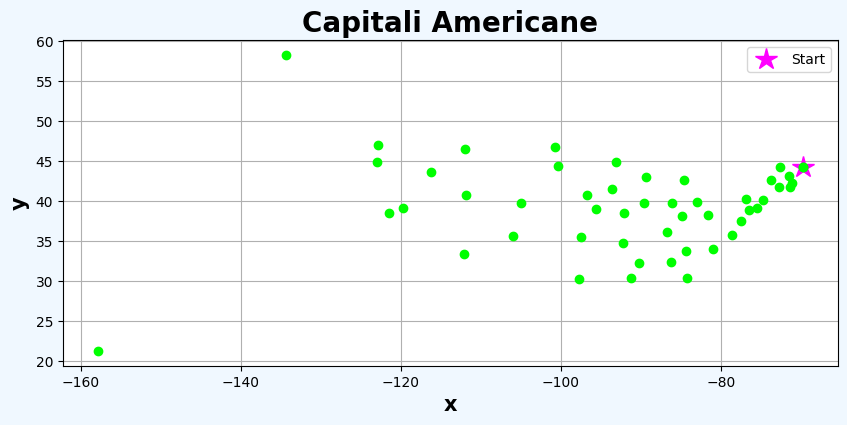

In [27]:
plt.figure(figsize = (10,7), facecolor = "ALICEBLUE")
x,y = np.loadtxt("EX_10.1/Configurazioni/configurazione0.dat", usecols=(0,1), delimiter=' ', unpack='true')
plt.plot(x[0],y[0], marker ="*", color = "Magenta", markersize = 16, label = "Start", linestyle = "")
plt.plot(x, y, marker = "o",mec = "Lime" , mfc = "lime", linestyle = "None", c = "INDIGO")
plt.ylabel('y', fontsize = 15, fontweight = "bold")
plt.xlabel('x', fontsize = 15, fontweight = "bold")
plt.grid(True)
plt.title('Capitali Americane', fontsize = 20, fontweight = "bold")
plt.legend()




plt.gca().set_aspect('equal', adjustable='box')

plt.show()

Puo' essere utile andare a visualizzare un esempio di percorso casuale; prendendo quello di input:

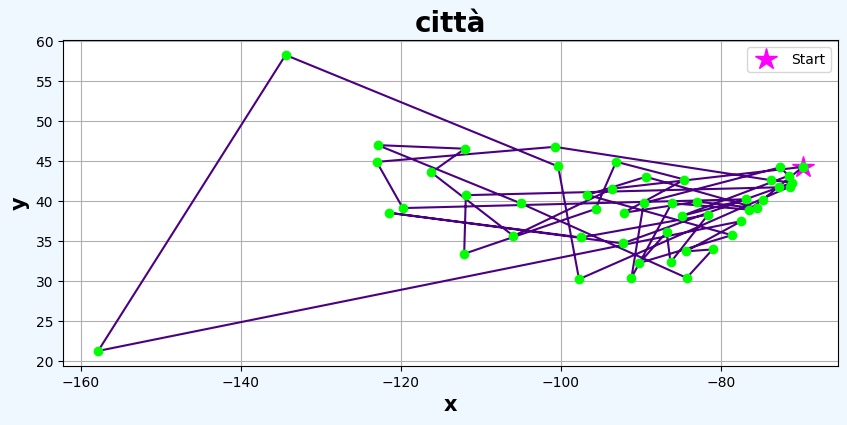

In [28]:
plt.figure(figsize = (10,7), facecolor = "ALICEBLUE")
x,y = np.loadtxt("EX_10.1/Configurazioni/configurazione0.dat", usecols=(0,1), delimiter=' ', unpack='true')
plt.plot(x[0],y[0], marker ="*", color = "Magenta", markersize = 16, label = "Start", linestyle = "")
plt.plot(x, y, marker = "o",mec = "Lime" , mfc = "lime", linestyle = "-", c = "INDIGO")
plt.ylabel('y', fontsize = 15, fontweight = "bold")
plt.xlabel('x', fontsize = 15, fontweight = "bold")
plt.grid(True)
plt.title('città', fontsize = 20, fontweight = "bold")
plt.legend()




plt.gca().set_aspect('equal', adjustable='box')

plt.show()

In [29]:

print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")
print('DATI ')
print("NUMERO CITTA\' = ", 50 )
print('DIMENSIONE POPOLAZIONE =', 500)
print("NUMERO GENERAZIONI = ", 1000)
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

DATI 
NUMERO CITTA' =  50
DIMENSIONE POPOLAZIONE = 500
NUMERO GENERAZIONI =  1000

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%



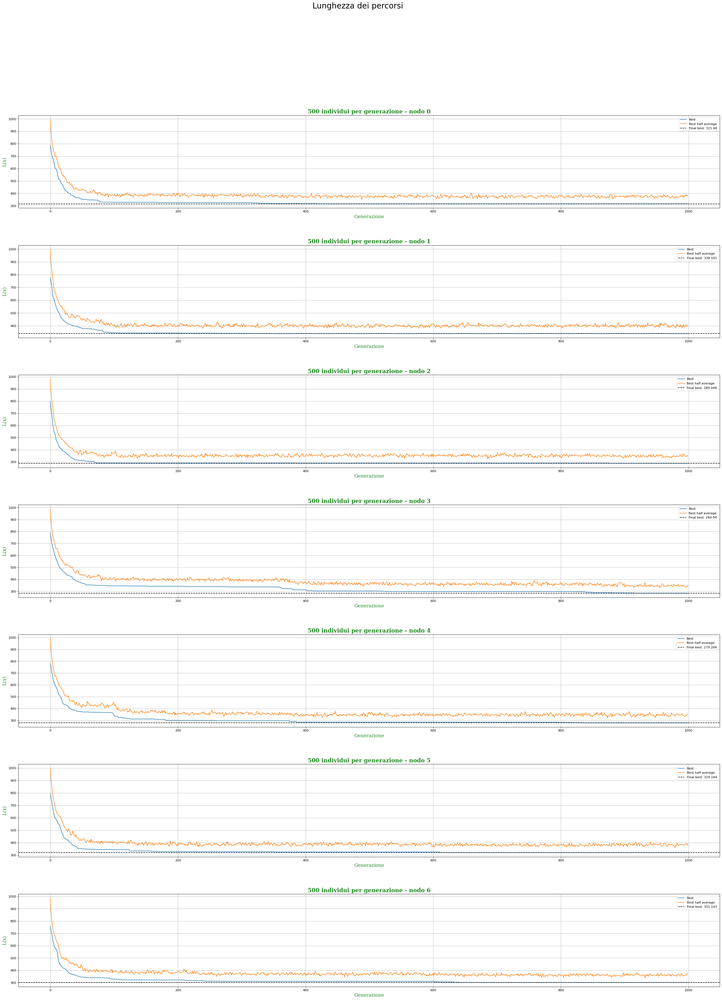

In [30]:
plt.figure(figsize=(40, 50), dpi=80)
plt.suptitle("L(x)", fontsize = 25)



for i in range(0,7):
    # using rank[i] individuals per generation
    plt.subplot(7,1,i+1)
    gen,best = np.loadtxt("EX_10.1/LBestPath"+str(i)+".dat", usecols=(0,1), delimiter=' ', unpack='true')
    plt.plot(gen, best, marker = "", label = "Best") 
    bestave = np.loadtxt("EX_10.1/L-medie"+str(i)+".dat", usecols=(1), delimiter=' ', unpack='true')
    plt.plot(gen, bestave, marker = "", label = "Best half average") 
    font = {"family":"serif", "color":"ForestGreen", "size":"15"}
    plt.ylabel('L(x)', fontdict = font)
    plt.xlabel('Generazione', fontdict = font)
    plt.grid(True)
    plt.title('500 individui per generazione - nodo '+str(i), fontsize = 18, fontweight = "bold", c = "ForestGreen", family = "serif")
    plt.axhline(y=best[-1], color = "k", linestyle = "--", label = "Final best: "+str(best[-1]))
    plt.legend()

plt.subplots_adjust(hspace=0.4)
plt.show()

In [33]:
myColors = ["cornflowerblue","skyblue","aqua","DeepSkyBlue","DarkSlateBlue", "Cyan", "DarkCyan", "Purple", "Blue", "DarkBlue"]

Riportiamo genericamente all'evolvere delle generazioni l'ottimizzazione dei vari processi:

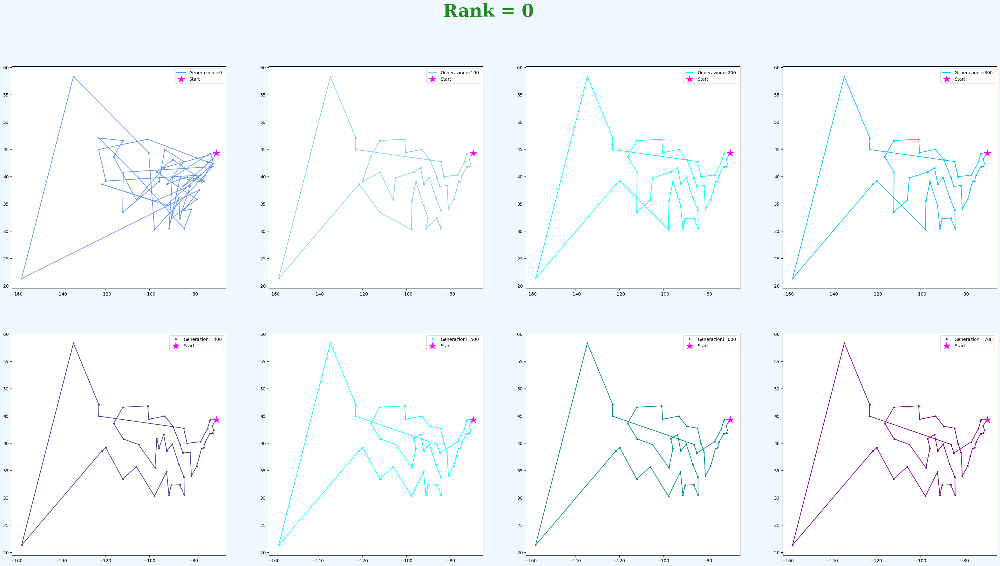

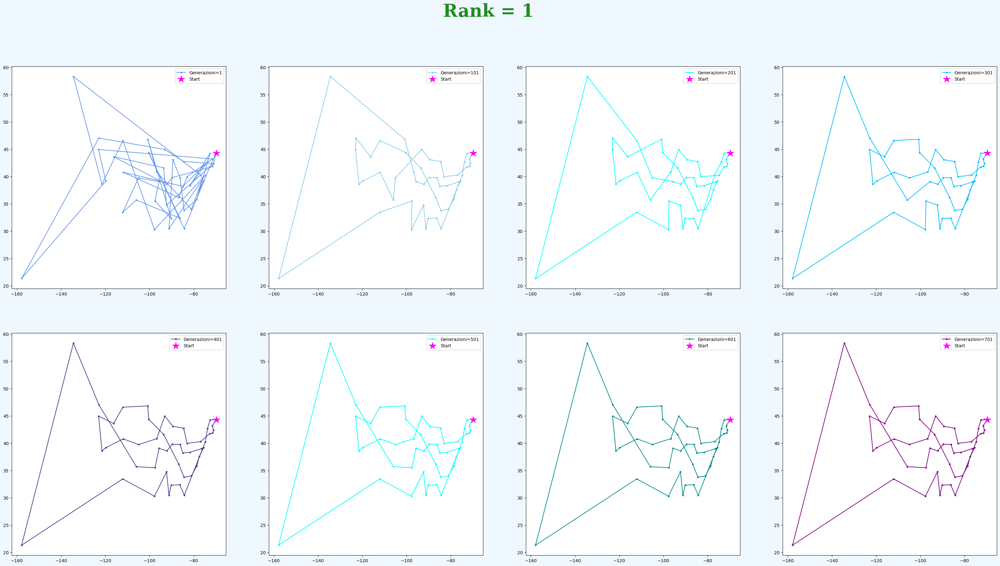

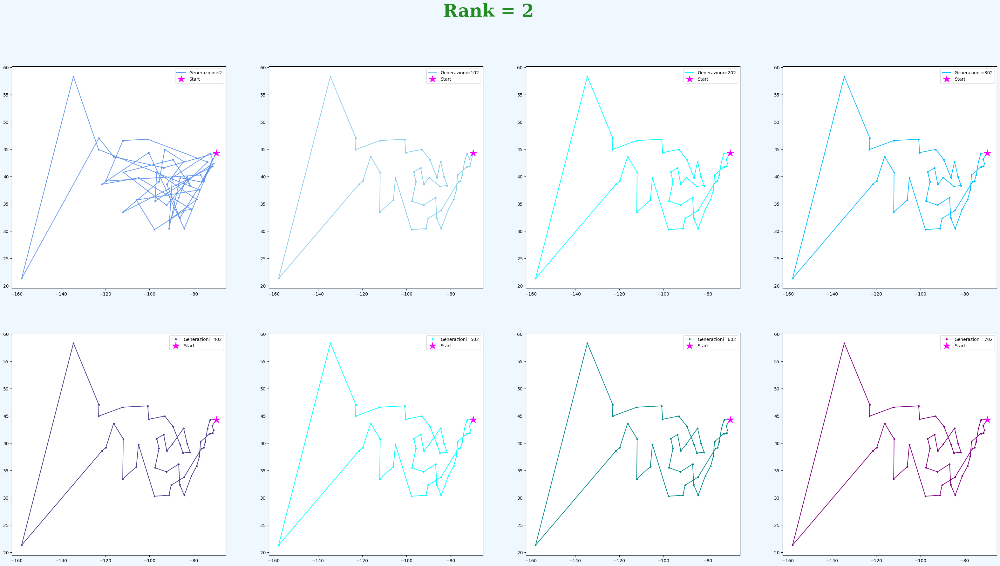

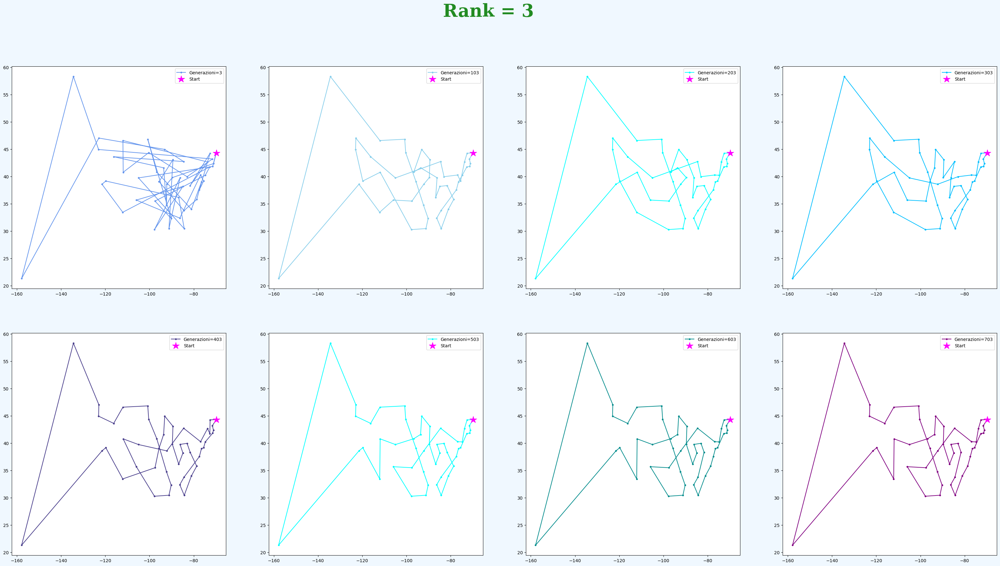

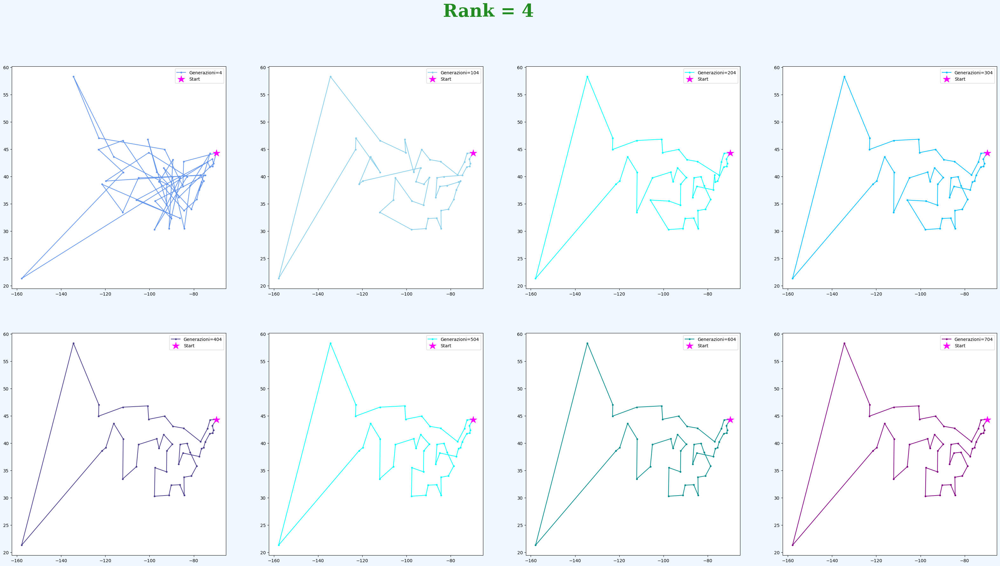

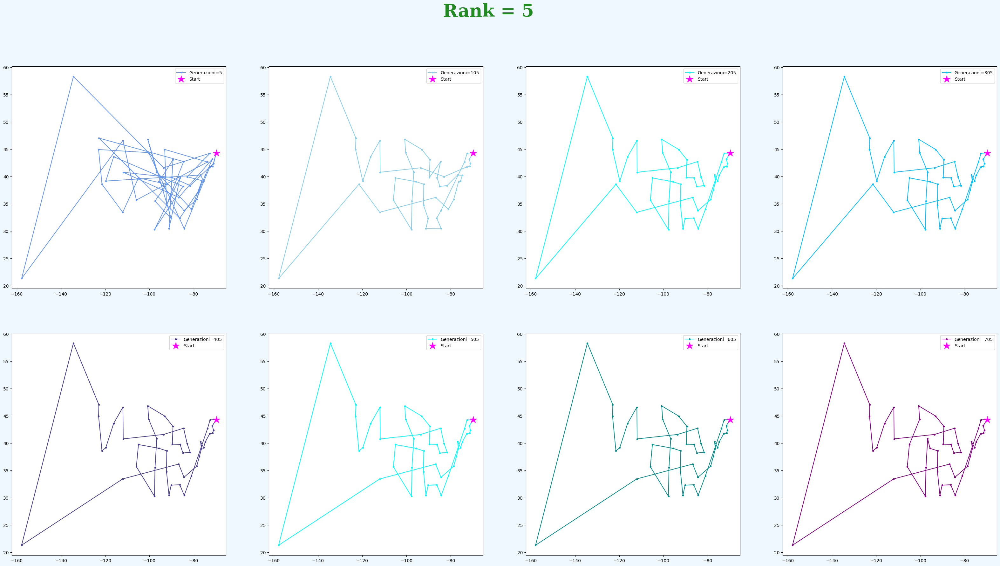

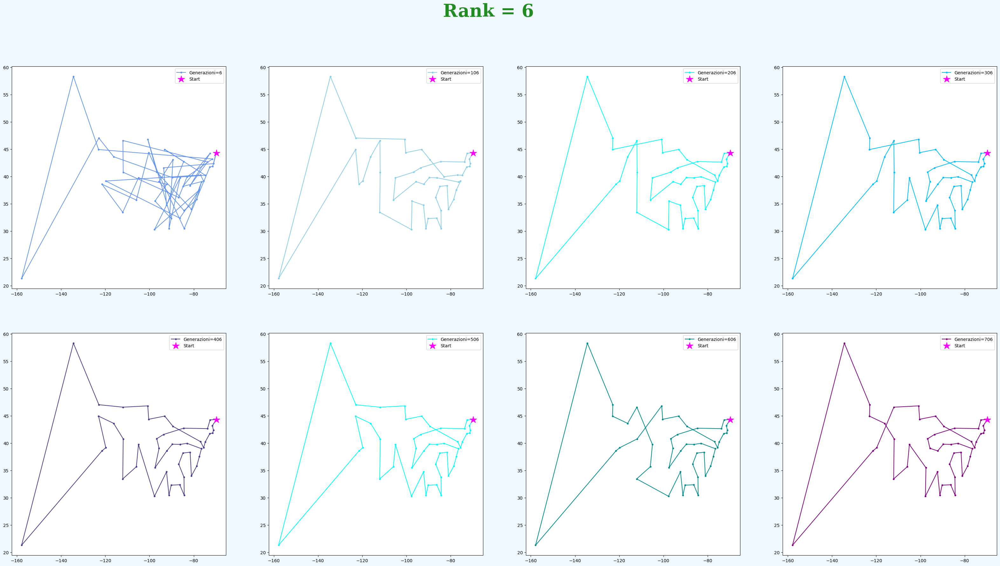

In [34]:

for j in range(0,7):
    
    plt.figure(figsize = (40,20), facecolor = "ALICEBLUE")
    plt.suptitle("Rank = " + str(j), fontsize = 40, family = "Serif", c = "ForestGreen", fontweight = "bold")
    for i in range(0,8):
        plt.subplot(2,4,i+1)
        x,y = np.loadtxt("EX_10.1/Configurazioni/configurazione"+str(i*100+j)+".dat", usecols=(0,1), unpack='true')
        plt.plot(x[0:],y[0:],label='Generazioni='+str(i*100+j),marker=".",color=myColors[i])
        plt.plot(x[0],y[0], marker ="*",color="mAGENTA", markersize = 16, label = "Start", linestyle = "")
        plt.legend(loc = "best")
plt.show()    
 



Consideriamo ora solo quelli alla 900-esima generazione:

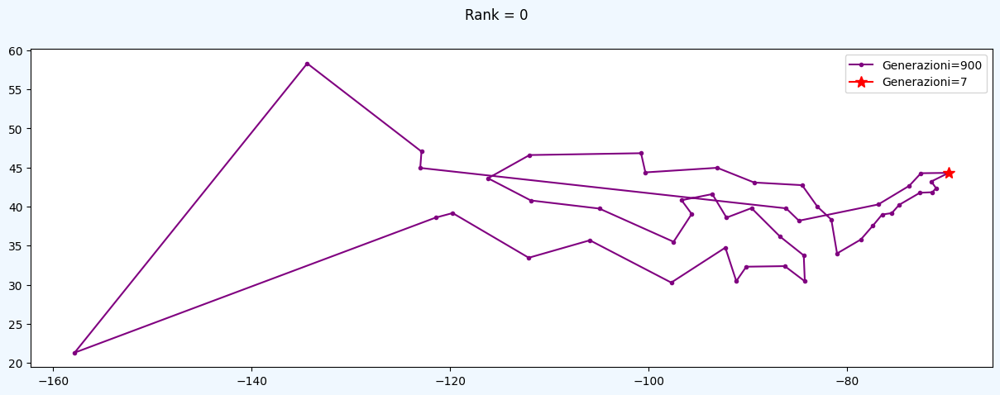

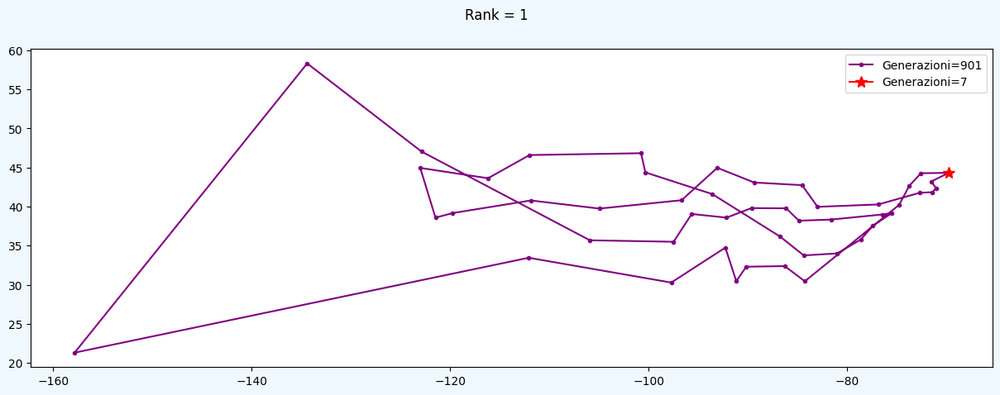

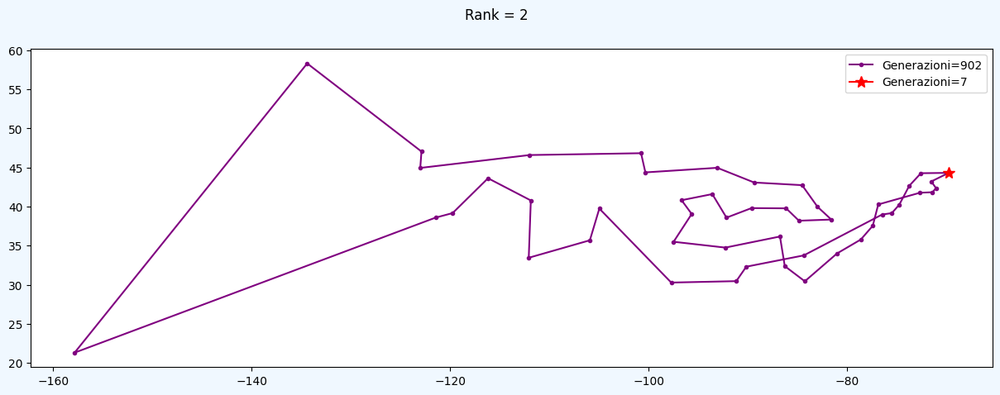

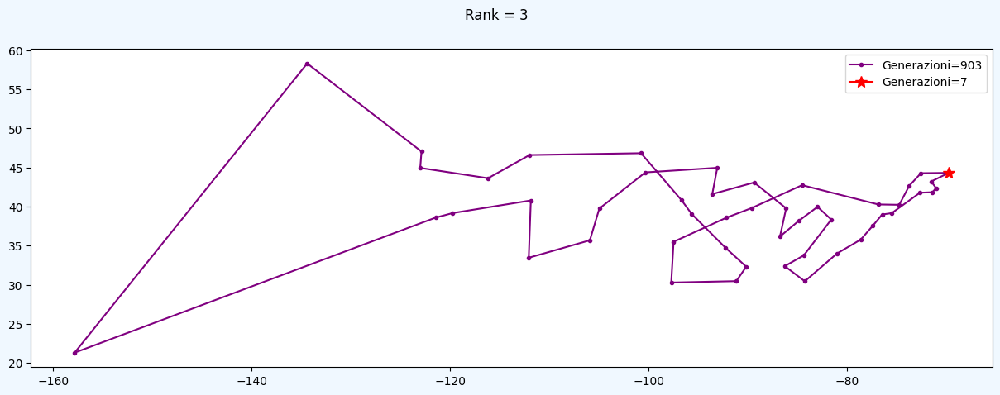

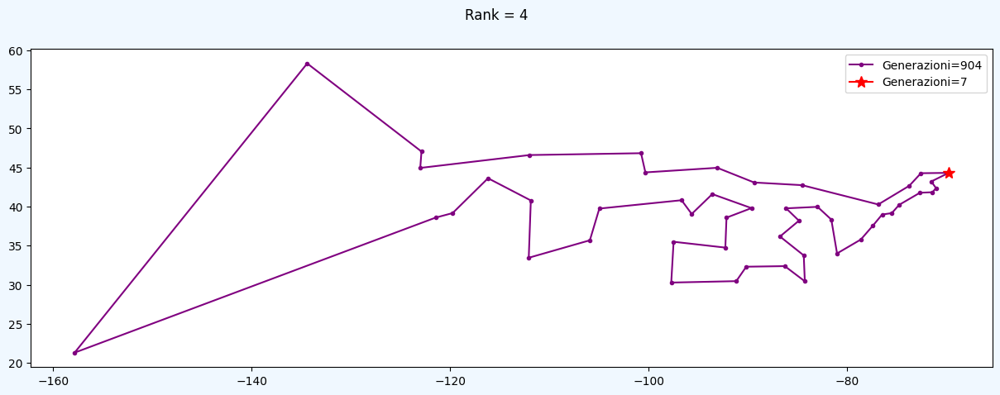

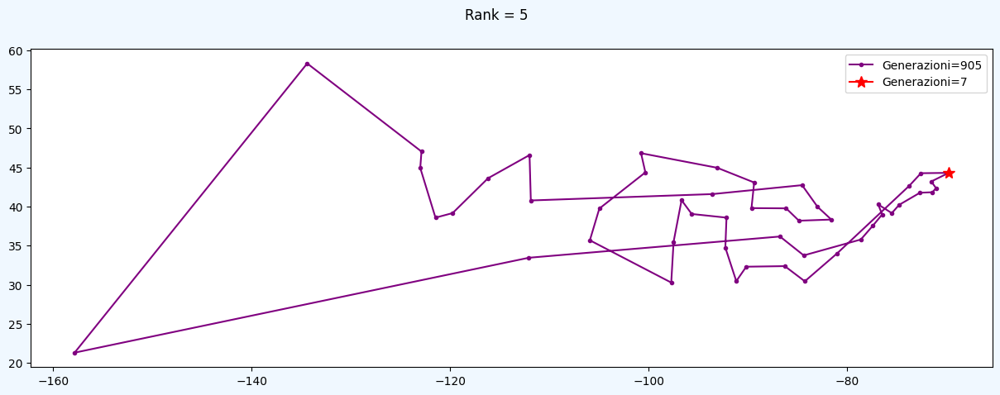

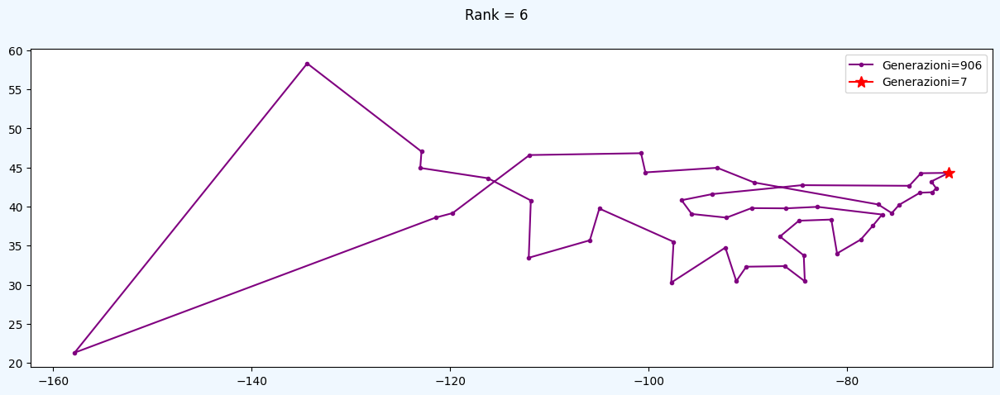

In [36]:
for j in range(0,7):
    
    plt.figure(figsize = (15,5), facecolor = "ALICEBLUE")
    plt.suptitle("Rank = " + str(j))
    x,y = np.loadtxt("EX_10.1_TOT/Configurazioni/configurazione"+str(900 + j)+".dat", usecols=(0,1), unpack='true')
    plt.plot(x[0:],y[0:],label='Generazioni='+str(900+j),marker=".",color=myColors[i])
    plt.plot(x[0],y[0],label='Generazioni='+str(i),marker="*",ms = 10, color="r")
    plt.legend(loc = "best")
plt.show()   

Tra tutti i processi, il caso migliore e' il seguente relatvio al rank 4:

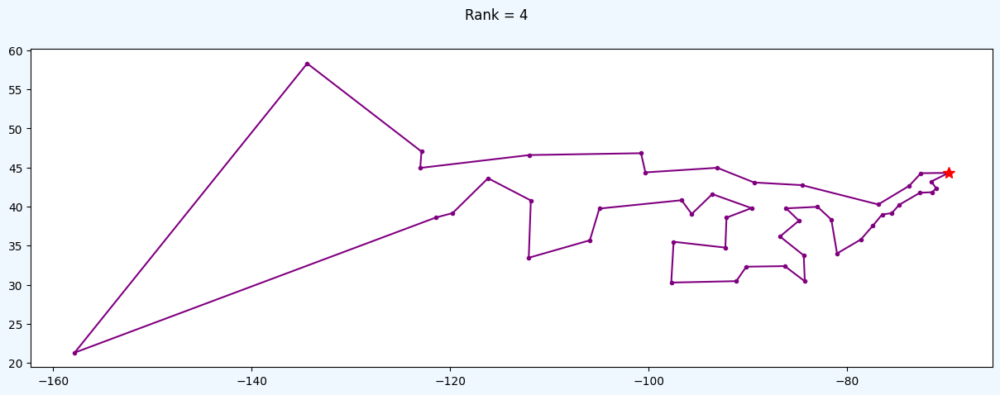

In [37]:
plt.figure(figsize = (15,5), facecolor = "ALICEBLUE")
plt.suptitle("Rank = " + str(4))
x,y = np.loadtxt("EX_10.1/Configurazioni/configurazione"+str(900 + 4)+".dat", usecols=(0,1), unpack='true')
plt.plot(x[0:],y[0:],label='Generazioni='+str(504),marker=".",color=myColors[i])
plt.plot(x[0],y[0],label='Generazioni='+str(4),marker="*",ms = 10, color="r")
plt.show()

In [38]:
gen,best = np.loadtxt("EX_10.1/LBestPath"+str(4)+".dat", usecols=(0,1), delimiter=' ', unpack='true')
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")
print('GENERAZIONE: ')
print(gen[-1])
print('BEST: L(x) = ')
print(best[-1])
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

GENERAZIONE: 
999.0
BEST: L(x) = 
279.284

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%



<h3><font color = 'LightGreen'>Continenti Dipendenti e Migrazioni:</font></h3>

Andiamo ora a vivacizzare i rapporti commerciali e a permettere migrazioni dei candidati migliori da un continente all'altro.
Grazie a svariate prove si sono ottenuti risultati interessanti: in primo luogo si osserva che quanto piu' le migrazioni sono numerose, tanto piu' le popolazioni tendono a rompere eventuali punti di equilibrio metastabili capaci di bloccare lo sviluppo delle ricerca; in seconda istanza,inoltre, si nota che le popolazioni dei vari continenti tendono ad avere una maggiore omogeneizzazione tra gli individui portandsi poi naturalmente ad assumere, al crescere delle generazioni, valori che si avvicinano all'ottimo.
In pratica, se vogliamo, in termini figurativi, questo comportamento riflette il fatto che in un mondo globalizzato e cosmopolita, in virtu' degli scambi tra le popolazione dei vari continenti, si ha modi di scambiarsi conoscenza ed informazioni ottimali per raggiungere infine la soluzione migliore al problema richiesto. 

In [11]:
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")
print('DATI ')
print("NUMERO CITTA\' = ", 50 )
print('DIMENSIONE POPOLAZIONE =', 500)
print("NUMERO GENERAZIONI = ", 1000)
print("MIGRAZIONI = ", 5)#UNA MIGRAZIONI OGNI 5 GENERAZIONI
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

DATI 
NUMERO CITTA' =  50
DIMENSIONE POPOLAZIONE = 500
NUMERO GENERAZIONI =  1000
MIGRAZIONI =  5

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%



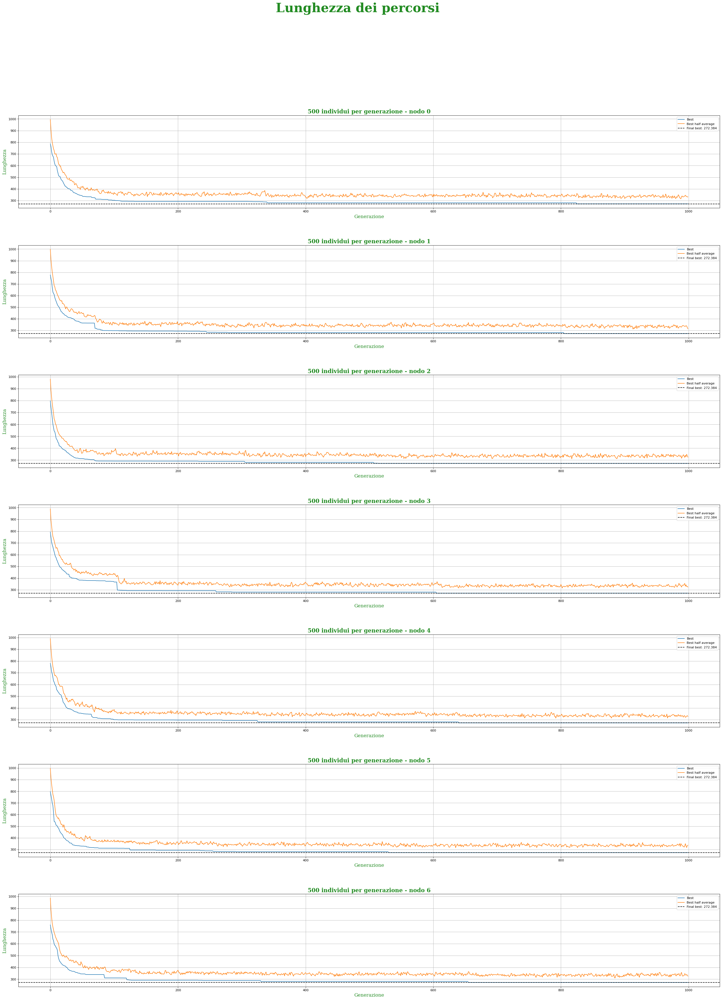

In [70]:
N = [100,110,120,150,190,220,230,240,250,280,290,300]
myColors = ["SpringGreen","ForestGreen", "Green", "Olive", "OliveDrab", "Lime", "PaleGreen", "DarkOliveGreen",  "LightGreen", "DarkGreen", "MediumSEaGreen",
            "LimeGreen"]
plt.figure(figsize=(40, 50), dpi=80)
plt.suptitle("Lunghezza dei percorsi\n", fontsize = 40, family = "Serif", c = "ForestGreen", fontweight = "bold")



for i in range(0,7):
    # using rank[i] individuals per generation
    plt.subplot(7,1,i+1)
    gen,best = np.loadtxt("EX_10.2/LBestPath"+str(i)+".dat", usecols=(0,1), delimiter=' ', unpack='true')
    plt.plot(gen, best, marker = "", label = "Best") 
    bestave = np.loadtxt("EX_10.2/L-medie"+str(i)+".dat", usecols=(1), delimiter=' ', unpack='true')
    plt.plot(gen, bestave, marker = "", label = "Best half average") 
    font = {"family":"serif", "color":"ForestGreen", "size":"15"}
    plt.ylabel('L(x)', fontdict = font)
    plt.xlabel('Generazione', fontdict = font)
    plt.grid(True)
    plt.title('500 individui per generazione - nodo '+str(i), fontsize = 18, fontweight = "bold", c = "ForestGreen", family = "serif")
    plt.axhline(y=best[-1], color = "k", linestyle = "--", label = "Final best: "+str(best[-1]))
    plt.legend()

plt.subplots_adjust(hspace=0.4)
plt.show()

Procedendo sempre come sopra, riportiamo una serie di soluzioni al crescere delle generazioni:

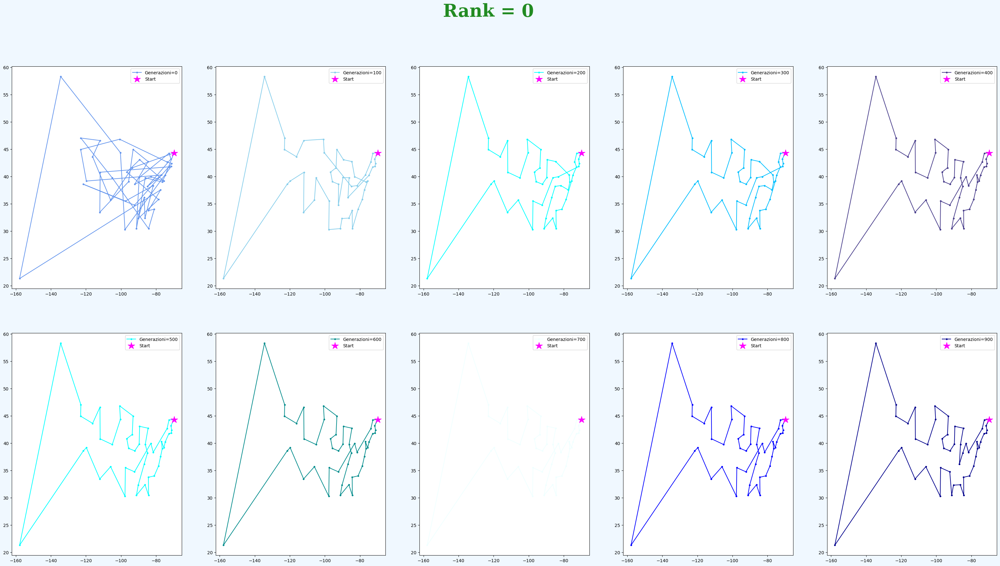

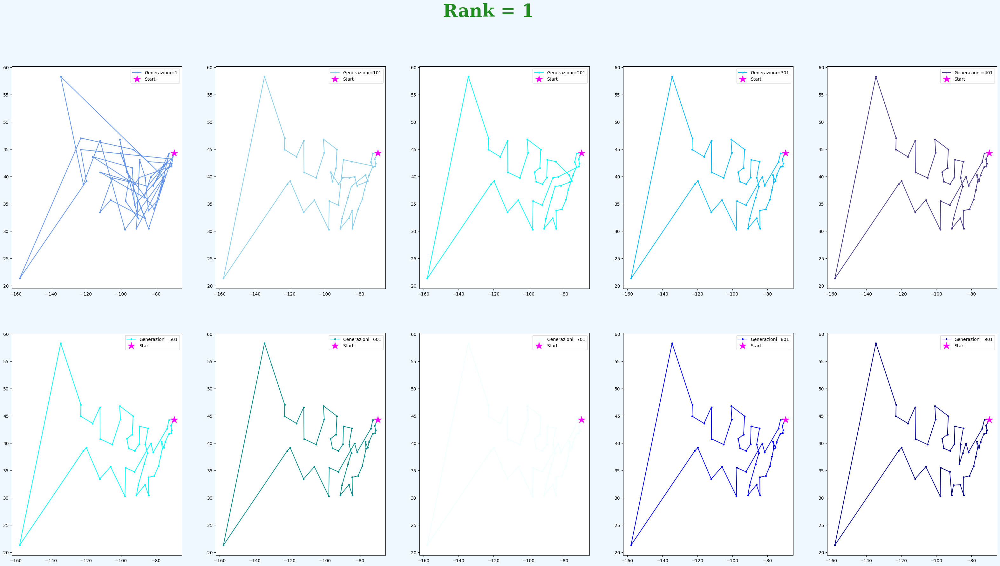

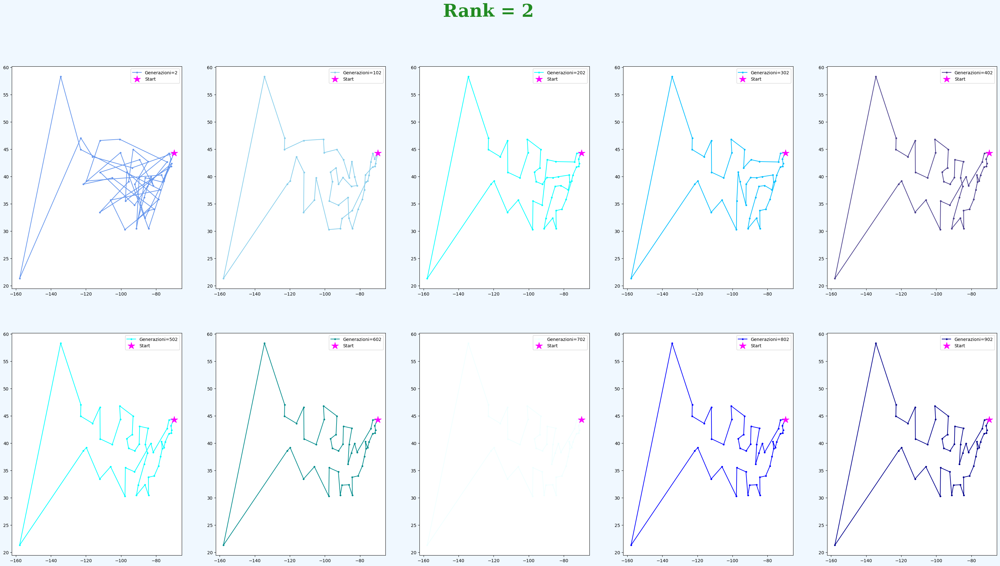

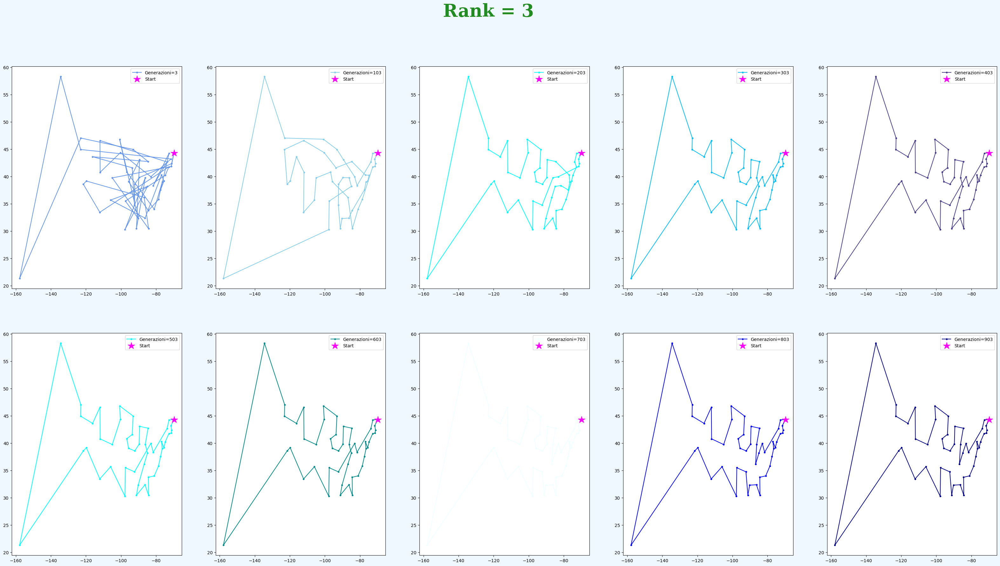

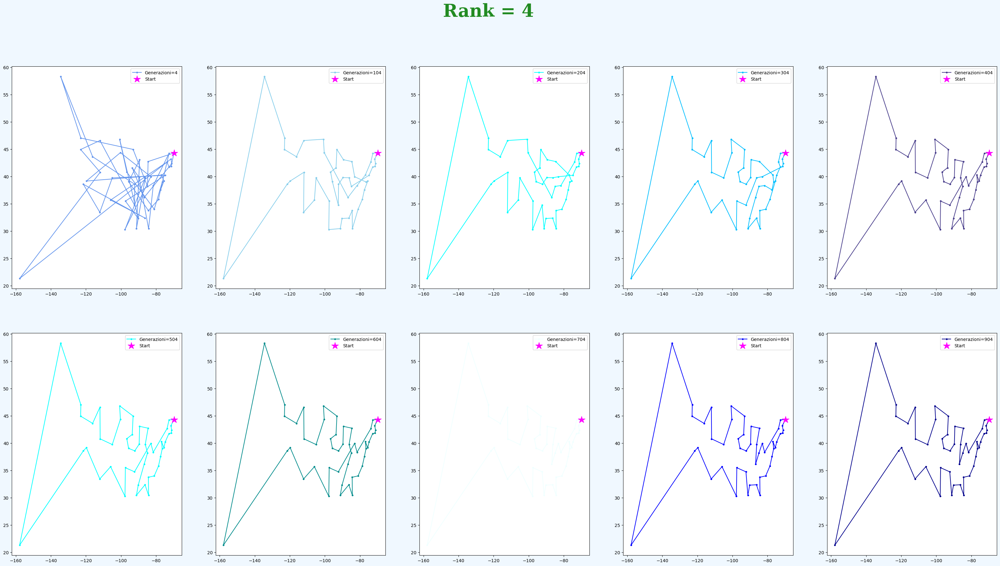

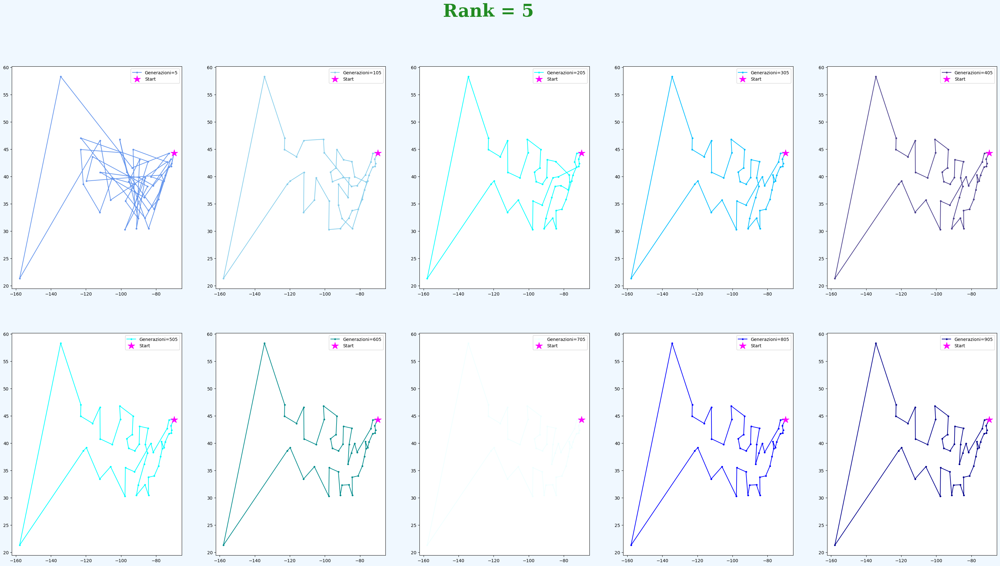

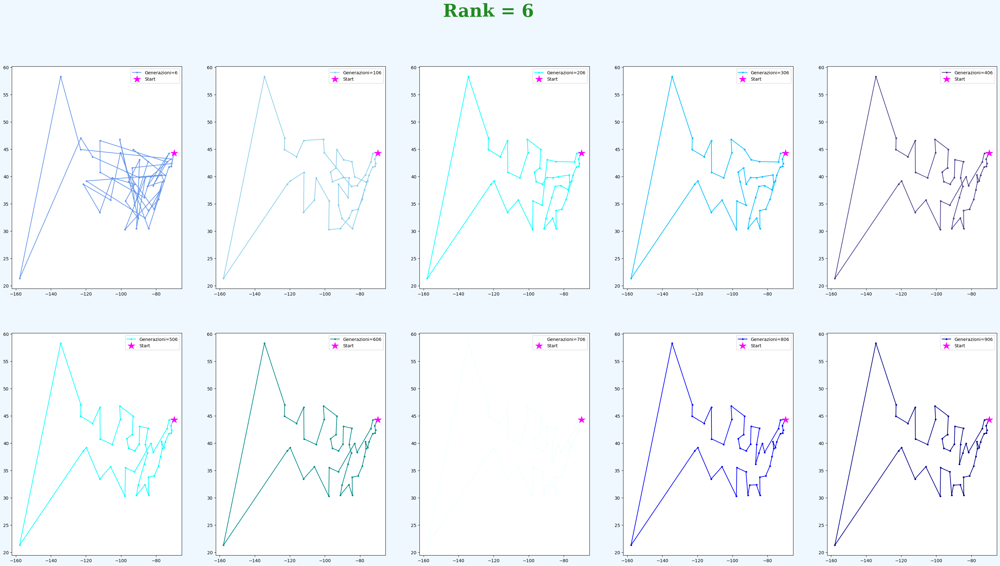

In [23]:
for j in range(0,7):
    
    plt.figure(figsize = (40,20), facecolor = "ALICEBLUE")
    plt.suptitle("Rank = " + str(j), fontsize = 40, family = "Serif", c = "ForestGreen", fontweight = "bold")
    for i in range(0,10):
        plt.subplot(2,5,i+1)
        x,y = np.loadtxt("EX_10.2/Configurazioni/configurazione"+str(i*100+j)+".dat", usecols=(0,1), unpack='true')
        plt.plot(x[0:],y[0:],label='Generazioni='+str(i*100+j),marker=".",color=myColors[i])
        plt.plot(x[0],y[0], marker ="*",color="mAGENTA", markersize = 16, label = "Start", linestyle = "")
        plt.legend(loc = "best")
    
plt.show()    


Notiamo la tendenza, accentuando gli scambi, da parte delle popolazioni dei vari continenti a convergere alla medesima soluzione limite ottimale.

La soluzione ottimale vediamo percio' che in questo paradigma e' pure migliore:

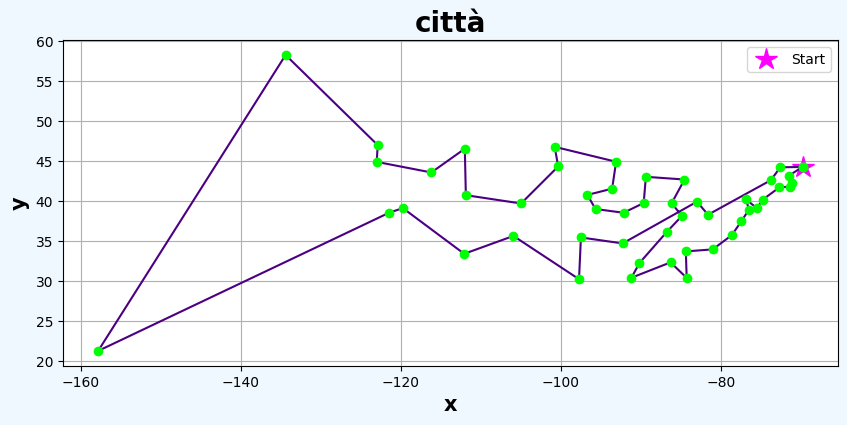

In [25]:
plt.figure(figsize = (10,7), facecolor = "ALICEBLUE")
x,y = np.loadtxt("EX_10.2//Configurazioni/configurazione700.dat", usecols=(0,1), delimiter=' ', unpack='true')
plt.plot(x[0],y[0], marker ="*", color = "Magenta", markersize = 16, label = "Start", linestyle = "")
plt.plot(x, y, marker = "o",mec = "Lime" , mfc = "lime", linestyle = "-", c = "INDIGO")
plt.ylabel('y', fontsize = 15, fontweight = "bold")
plt.xlabel('x', fontsize = 15, fontweight = "bold")
plt.grid(True)
plt.title('città', fontsize = 20, fontweight = "bold")
plt.legend()




plt.gca().set_aspect('equal', adjustable='box')

plt.show()

In [18]:
gen,best = np.loadtxt("EX_10.2_TOT/LBestPath"+str(4)+".dat", usecols=(0,1), delimiter=' ', unpack='true')
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")
print('GENERAZIONE: ')
print(gen[-1])
print('BEST: L(x) = ')
print(best[-1])
print("")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("")


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

GENERAZIONE: 
999.0
BEST: L(x) = 
272.384

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%



La soluzione ottimale vediamo percio' che in questo paradigma e' pure stata migliorata permettondo di efficientare la ricerca.